In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from wordcloud import WordCloud
from scipy.stats import chi2_contingency
import matplotlib.gridspec as gridspec
import re
import ast
import json
from IPython.display import IFrame

from ast import literal_eval
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from lightgbm import LGBMRegressor
from sklearn.base import clone
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
# Import necessary libraries
from fastai.tabular.all import *
from fastai.metrics import accuracy
import pandas as pd


In [3]:
# Specify the correct path to your Excel file
file_path = 'BIA/sephora/sephora/spiders/sephora_data_FINAL_reviews_new.xlsx'

# Read the Excel file using pd.read_excel
dataset = pd.read_excel(file_path)

In [4]:
dataset.head()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
0,12.1K,Platinum Long Lash Serum,$150.00,438,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,..."
1,10.7K,Vitamin C+B+E Ferulic Serum,$145.00,328,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning and 

In [5]:
dataset.describe()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
count,584,584,564,578,584,578,578,578,578,578,578
unique,411,582,113,323,93,563,559,561,562,559,544
top,2.6K,Strawberry Lip Balm,$38.00,1.2K,SKYLAR,"['Extremely disappointing buy after reading all of the positive reviews. I was so excited to try this! \nThe first thing I smelled after spraying was alcohol and then it faded to nothing. I barely used it, and when next I tried, it no longer sprayed. After opening the opaque bottle, I discovered it was already empty!', 'I blind bought this on a whim. Smells great but doesn’t last very long on me. Great affordable perfume.', 'Gorgeous sweet but mature scent..immediately bought the big bottle', ""I was excited to try this one, but I don't really understand the hype. It smells very underwhelmi...",['Brown'],[],"[, 'lightMedium', 'Medium', 'Fair', , , 'Light', 'Medium', 'Medium', 'Medium', 'Medium', 'Light', 'Light', , 'Light', 'Medium', 'Fair', , , , 'Medium', 'Light', 'Light', 'Light', 'Medium', 'Light', 'Fair', 'Light', 'Light', , 'Tan', , , , , , 'Light', , 'Light', , , , 'Light', 'Deep', 'Tan', , 'Fair', , 'Light', 'Deep', , , 'Medium', , , 'Tan', 'Light', 'Light', 'Light', 'Light', 'Light', 'Medium', , , 'Light', 'Light', 'Fair', , , , , , 'Medium', 'Light', , 'Medium', , 'Olive', , , 'Light', 'Deep', 'Fair', , 'Light', , , 'Fair', 'Light', , , , 'Light', , 'Light', 'Deep', , 'Light', , 'Lig...",['Combination'],[True]
freq,10,2,26,10,8,2,4,2,2,3,6


In [6]:
dataset.head()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
0,12.1K,Platinum Long Lash Serum,$150.00,438,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,..."
1,10.7K,Vitamin C+B+E Ferulic Serum,$145.00,328,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning and 

In [7]:
# Check for null values in each column
null_counts = dataset.isnull().sum()

# Display the null counts
print("Null counts in each column:")
print(null_counts)

Null counts in each column:
product_likes              1
product_name               1
product_price             21
product_reviewCount        7
product_brand              1
customer_reviewtext        7
customer_eyecolor          7
customer_haircolor         7
customer_skintone          7
customer_skintype          7
customer_isrecommended     7
dtype: int64


In [8]:
# Remove rows with null values
dataset_cleaned = dataset.dropna()

# Display information about the cleaned DataFrame
print("Shape of the original DataFrame:", dataset.shape)
print("Shape of the cleaned DataFrame:", dataset_cleaned.shape)

Shape of the original DataFrame: (585, 11)
Shape of the cleaned DataFrame: (558, 11)


In [9]:
dataset.dtypes

product_likes             object
product_name              object
product_price             object
product_reviewCount       object
product_brand             object
customer_reviewtext       object
customer_eyecolor         object
customer_haircolor        object
customer_skintone         object
customer_skintype         object
customer_isrecommended    object
dtype: object

In [10]:
df = dataset

In [11]:
df.head()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
0,12.1K,Platinum Long Lash Serum,$150.00,438,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,..."
1,10.7K,Vitamin C+B+E Ferulic Serum,$145.00,328,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning and 

In [12]:
# Define a custom conversion function for 'K' values
def convert_K_to_int(value):
    if pd.notna(value) and isinstance(value, str) and 'K' in value:
        return int(float(value.replace('K', '')) * 1000)
    else:
        return value

# Convert 'product_likes' column to numeric
df['product_likes'] = df['product_likes'].apply(convert_K_to_int)

# Convert 'product_reviewCount' column to numeric
df['product_reviewCount'] = df['product_reviewCount'].apply(convert_K_to_int)

# Display the first few rows of the updated DataFrame
print(df.head())

  product_likes                                         product_name  \
0         12100                             Platinum Long Lash Serum   
1         10700                          Vitamin C+B+E Ferulic Serum   
2         17000                            Platinum Lip Plump SPF 30   
3          1300                                   Platinum Lip Plump   
4        533500  Protini™ Polypeptide Firming Refillable Moisturizer   

  product_price product_reviewCount                      product_brand  \
0       $150.00                 438  Dr. Lara Devgan Scientific Beauty   
1       $145.00                 328  Dr. Lara Devgan Scientific Beauty   
2        $50.00                 600  Dr. Lara Devgan Scientific Beauty   
3        $50.00                  47  Dr. Lara Devgan Scientific Beauty   
4        $68.00                7100                     Drunk Elephant   

                                                                                                                          

In [13]:
df.head()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
0,12100,Platinum Long Lash Serum,$150.00,438,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,..."
1,10700,Vitamin C+B+E Ferulic Serum,$145.00,328,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning and 

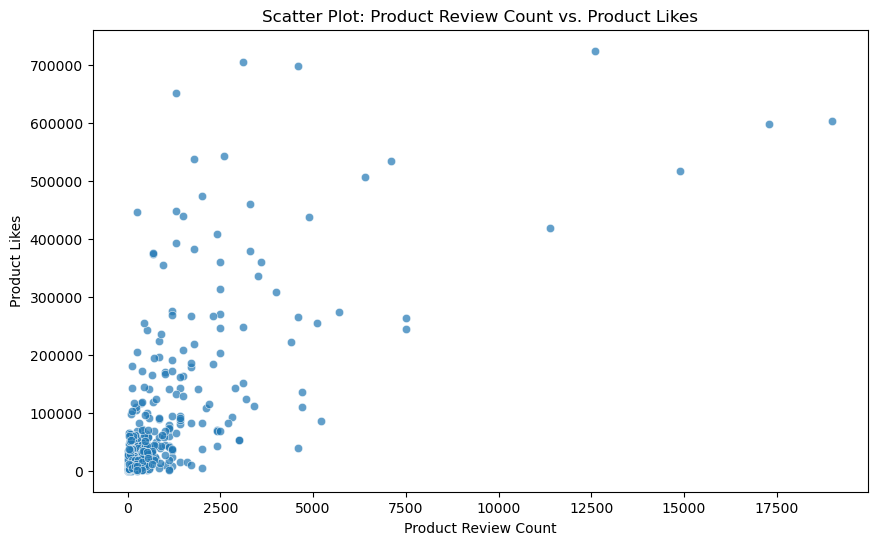

In [14]:
# Ensure 'product_reviewCount' and 'product_likes' columns are numeric
df['product_reviewCount'] = pd.to_numeric(df['product_reviewCount'], errors='coerce')
df['product_likes'] = pd.to_numeric(df['product_likes'], errors='coerce')

# Create a scatter plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(x='product_reviewCount', y='product_likes', data=df, alpha=0.7)

# Set labels and title
plt.xlabel('Product Review Count')
plt.ylabel('Product Likes')
plt.title('Scatter Plot: Product Review Count vs. Product Likes')

# Show the plot
plt.show()

C:\Users\PURANJAY\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 9 (	) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


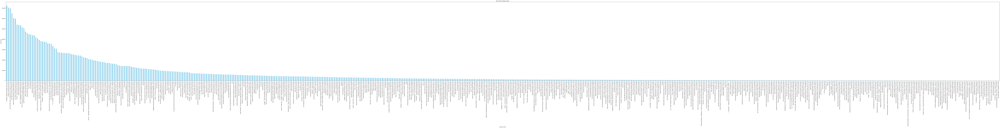

In [15]:
df['product_likes'] = pd.to_numeric(df['product_likes'].replace('[KkMm]', '', regex=True), errors='coerce')

# Create a bar chart for product likes
plt.figure(figsize=(200, 16))
bar_chart_likes = df.groupby('product_name')['product_likes'].sum().sort_values(ascending=False).plot(kind='bar', color='skyblue')
plt.title('Bar Chart: Product Likes')
plt.ylabel('Total Likes')
plt.show()

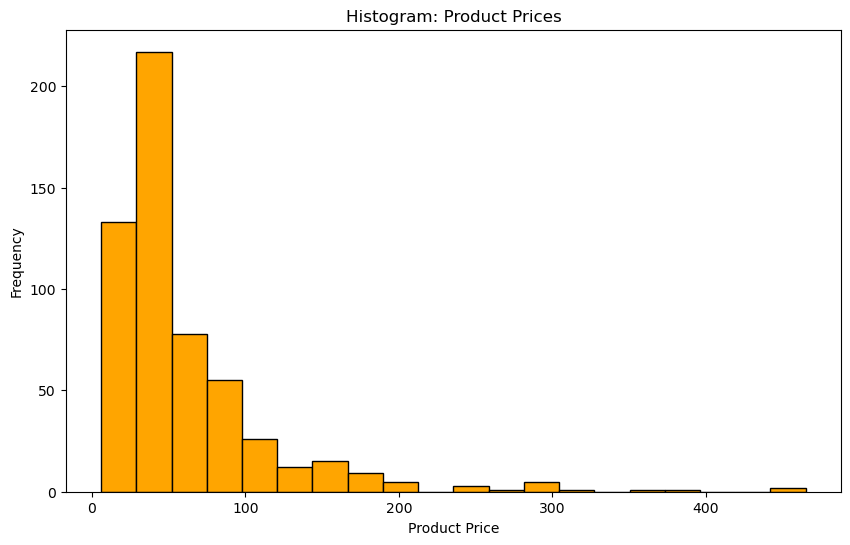

In [16]:
# Ensure 'product_price' column is numeric
df['product_price'] = pd.to_numeric(df['product_price'].replace('[\$,]', '', regex=True), errors='coerce')

# Create a histogram for product prices
plt.figure(figsize=(10, 6))
histogram_prices = df['product_price'].plot(kind='hist', bins=20, color='orange', edgecolor='black')
plt.title('Histogram: Product Prices')
plt.xlabel('Product Price')
plt.ylabel('Frequency')
plt.show()


In [17]:
def summary(df):
    print(f'data shape: {df.shape}')  
    summ = pd.DataFrame(df.dtypes, columns=['data type'])
    summ['#missing'] = df.isnull().sum().values 
    summ['%missing'] = df.isnull().sum().values / len(df)* 100
    summ['#unique'] = df.nunique().values
    desc = pd.DataFrame(df.describe(include='all').transpose())
    summ['min'] = desc['min'].values
    summ['max'] = desc['max'].values
    return summ

In [18]:
summary(df).style.background_gradient(cmap='Blues')

data shape: (585, 11)


,data type,#missing,%missing,#unique,min,max
product_likes,float64,2,0.341880,410,245.000000,723900.000000
product_name,object,1,0.170940,582,nan,nan
product_price,float64,21,3.589744,113,6.000000,465.000000
product_reviewCount,float64,7,1.196581,323,1.000000,19000.000000
product_brand,object,1,0.170940,93,nan,nan
customer_reviewtext,object,7,1.196581,563,nan,nan
customer_eyecolor,object,7,1.196581,559,nan,nan
customer_haircolor,object,7,1.196581,561,nan,nan
customer_skintone,object,7,1.196581,562,nan,nan
customer_skintype,object,7,1.196581,559,nan,nan


In [19]:
dataset.head()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,..."
1,10700.0,Vitamin C+B+E Ferulic Serum,145.0,328.0,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning 

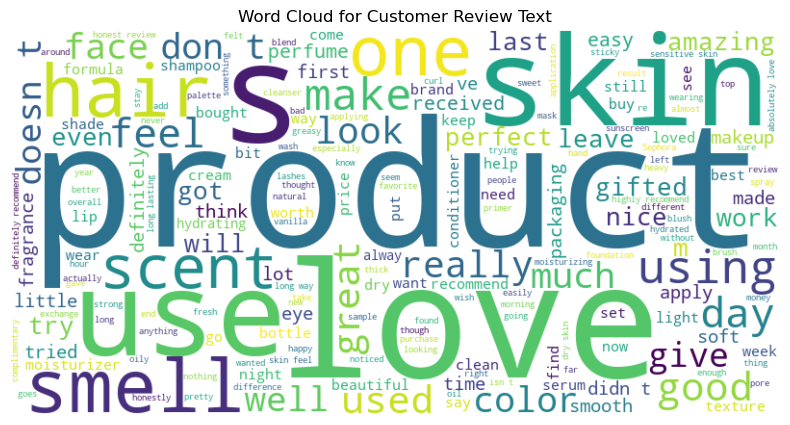

In [20]:
text_data = ' '.join(df['customer_reviewtext'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text_data)

# Plot the WordCloud image
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Customer Review Text')
plt.show()



In [21]:
likes_by_brand = df.groupby('product_brand')['product_likes'].sum().sort_values(ascending=False).reset_index()

In [22]:
likes_by_brand

,product_brand,product_likes
0,Urban Decay,2520400.0
1,Too Faced,2449800.0
2,Sol de Janeiro,1895200.0
3,Dior,1870900.0
4,Tower 28 Beauty,1848800.0
...,...,...
88,SOBEL SKIN Rx,3787.0
89,ABBOTT,3700.0
90,Smile Makers,3680.0
91,Tabu,2069.0


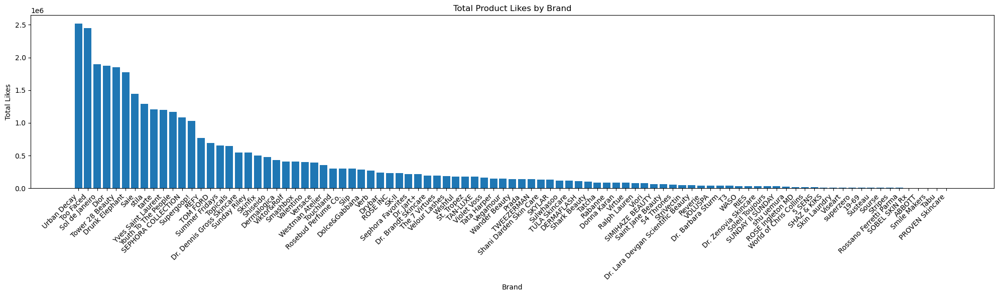

In [23]:
plt.figure(figsize=(20, 6))
plt.bar(likes_by_brand['product_brand'], likes_by_brand['product_likes'])
plt.xlabel('Brand')
plt.ylabel('Total Likes')
plt.title('Total Product Likes by Brand')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


In [24]:
full_features = dataset.columns.tolist()

In [25]:
full_features

['product_likes',
 'product_name',
 'product_price',
 'product_reviewCount',
 'product_brand',
 'customer_reviewtext',
 'customer_eyecolor',
 'customer_haircolor',
 'customer_skintone',
 'customer_skintype',
 'customer_isrecommended']

In [26]:
corr_var = [ 'customer_eyecolor',
 'customer_haircolor',
 'customer_skintone',
 'customer_skintype',
 'customer_isrecommended']

In [27]:
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2, _, _, _ = chi2_contingency(confusion_matrix)
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

def correlation_plot(data=None, variables=None):
    if data is None or variables is None:
        raise ValueError("Please provide data and variables.")
    
    # Calculate Cramér's V for each pair of variables
    corr_matrix = pd.DataFrame(index=variables, columns=variables, dtype=float)
    for var1 in variables:
        for var2 in variables:
            corr_matrix.loc[var1, var2] = cramers_v(data[var1], data[var2])

    plt.figure(figsize=(10, 6))
    sns.heatmap(corr_matrix, annot=True, cmap='Blues', fmt='.2f', linewidths=1, square=True, annot_kws={"size": 9})
    plt.title('Cramér\'s V - Correlation Matrix', fontsize=15)
    plt.xticks(rotation=40, ha='right')
    plt.show()


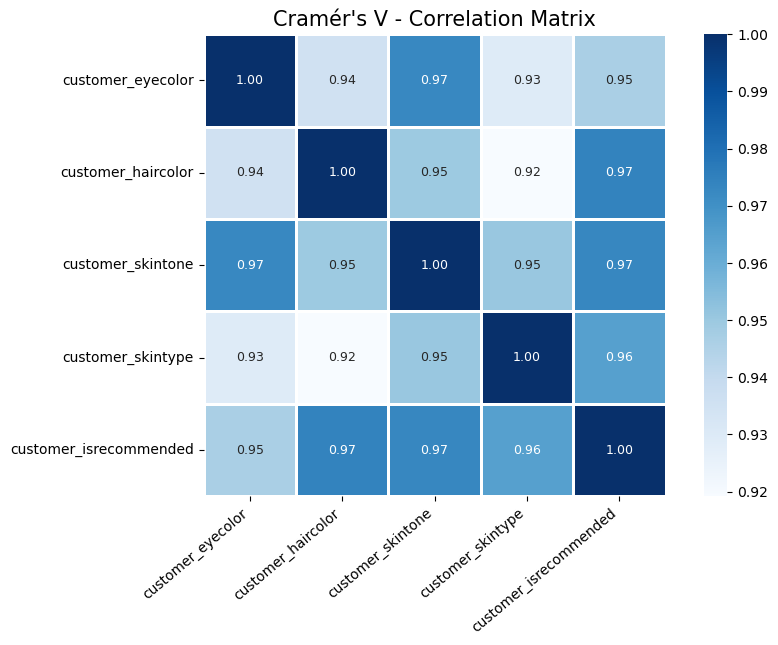

In [28]:
correlation_plot(data=df, variables=corr_var)

In [29]:
def search_high_corr_pairs(data_set=None, variables=None, threshold=0.7):
    high_corr_pairs = []

    for i in range(len(variables)):
        for j in range(i + 1, len(variables)):
            correlation = cramers_v(data_set[variables[i]], data_set[variables[j]])
            if abs(correlation) > threshold:
                print(
                    f'\033[91m{variables[i]}\033[0m and \033[91m{variables[j]}\033[0m are highly correlated, indicating the possibility of association.')
                high_corr_pairs.append((variables[i], variables[j]))
    return high_corr_pairs

high_corr_pairs = search_high_corr_pairs(data_set=dataset, variables=corr_var)


customer_eyecolor and customer_haircolor are highly correlated, indicating the possibility of association.
customer_eyecolor and customer_skintone are highly correlated, indicating the possibility of association.
customer_eyecolor and customer_skintype are highly correlated, indicating the possibility of association.
customer_eyecolor and customer_isrecommended are highly correlated, indicating the possibility of association.
customer_haircolor and customer_skintone are highly correlated, indicating the possibility of association.
customer_haircolor and customer_skintype are highly correlated, indicating the possibility of association.
customer_haircolor and customer_isrecommended are highly correlated, indicating the possibility of association.
customer_skintone and customer_skintype are highly correlated, indicating the possibility of association.
customer_skintone and customer_isrecommended are highly correlated, indicating the possibility of association.
customer_skintype and custo

In [30]:
high_corr_pairs

[('customer_eyecolor', 'customer_haircolor'),
 ('customer_eyecolor', 'customer_skintone'),
 ('customer_eyecolor', 'customer_skintype'),
 ('customer_eyecolor', 'customer_isrecommended'),
 ('customer_haircolor', 'customer_skintone'),
 ('customer_haircolor', 'customer_skintype'),
 ('customer_haircolor', 'customer_isrecommended'),
 ('customer_skintone', 'customer_skintype'),
 ('customer_skintone', 'customer_isrecommended'),
 ('customer_skintype', 'customer_isrecommended')]

In [31]:
def median_absolute_error(y_true, y_pred):
    errors = np.abs(y_true - y_pred)
    medae = np.median(errors)
    return medae

In [32]:
dataset_model = dataset


In [33]:
dataset['customer_eyecolor'] =dataset['customer_eyecolor'].astype("string")
eye_color=dataset['customer_eyecolor']

# CLEANING AND SORTING OF CUSTOMER EYECOLOR

In [34]:
merged_list = ', '.join(dataset['customer_eyecolor'].astype(str))
# Extract hair colors using regex
hair_colors = re.findall(r"'(\w+)'", merged_list)

# Remove empty strings
cleaned_eye_colors = [color for color in hair_colors if color]
result_list = merged_list.split(', ')
# Clean up the elements in the list
cleaned_list = [element.strip("'") for element in result_list if element]
result_string = ', '.join(cleaned_eye_colors)
# Remove trailing commas and split the string into a list
result_list = result_string.rstrip(',').split(', ')
unique_elements = list(set(result_list))
unique_elements
# Create a DataFrame with one-hot encoding
one_hot_df = pd.get_dummies(result_list, prefix='eye_color')

# Concatenate the two dataframes along the columns (axis=1)
final_dataset_eyecolor = pd.concat([dataset_model, one_hot_df], axis=1)

# Print the final dataset
final_dataset_eyecolor

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended,eye_color_Blue,eye_color_Brown,eye_color_Gray,eye_color_Green,eye_color_Grey,eye_color_Hazel
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,...",0,1,0,0,0,0
1,10700.

In [35]:
df.head()

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,..."
1,10700.0,Vitamin C+B+E Ferulic Serum,145.0,328.0,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning 

# Cleaning of Customer Haircolor Column

In [36]:
merged_list = ', '.join(dataset['customer_haircolor'].astype(str))
# Extract hair colors using regex
hair_colors = re.findall(r"'(\w+)'", merged_list)

# Remove empty strings
cleaned_hair_colors = [color for color in hair_colors if color]

print(cleaned_hair_colors)

['brown', 'blonde', 'blonde', 'black', 'blonde', 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', 'black', 'blonde', 'black', 'brown', 'blonde', 'black', 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', 'blonde', 'blonde', 'black', 'brown', 'blonde', 'black', 'brown', 'blonde', 'brown', 'brown', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'black', 'blonde', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'blonde', 'blonde', 'brown', 'black', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'blonde', 'blonde', 'brown', 'brown', 'brown', 'brown', 'black', 'blon

In [37]:
result_list = merged_list.split(', ')
# Clean up the elements in the list
cleaned_list = [element.strip("'") for element in result_list if element]

In [38]:
result_string = ', '.join(cleaned_hair_colors)
print(result_string)


brown, blonde, blonde, black, blonde, blonde, blonde, blonde, blonde, brown, blonde, blonde, black, blonde, black, brown, blonde, black, black, brown, brown, brown, brown, blonde, blonde, blonde, black, brown, brown, brown, blonde, brown, black, blonde, brown, brown, brown, brown, brown, blonde, brown, brown, blonde, brown, auburn, brown, blonde, brown, blonde, brown, brown, brown, black, brown, black, blonde, brown, brown, blonde, black, brown, blonde, blonde, black, brown, blonde, black, brown, blonde, brown, brown, brown, blonde, brown, blonde, brown, brown, black, blonde, blonde, brown, brown, brown, brown, brown, blonde, brown, blonde, blonde, brown, black, blonde, brown, auburn, brown, blonde, brown, brown, blonde, blonde, blonde, brown, brown, brown, brown, black, blonde, blonde, brown, black, brown, blonde, blonde, blonde, brown, brown, black, blonde, brown, brown, blonde, red, brown, blonde, blonde, brown, blonde, black, blonde, brown, black, brown, blonde, black, black, blond

In [39]:
# Remove trailing commas and split the string into a list
result_list = result_string.rstrip(',').split(', ')

In [40]:
 unique_elements = list(set(result_list))

In [41]:
# Create a DataFrame with one-hot encoding
one_hot_df = pd.get_dummies(result_list, prefix='hair_color')

# Concatenate the two dataframes along the columns (axis=1)
final_dataset_hair_color = pd.concat([dataset_model, one_hot_df], axis=1)

# Print the final dataset
final_dataset_hair_color

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended,hair_color_auburn,hair_color_black,hair_color_blonde,hair_color_brown,hair_color_brunette,hair_color_gray,hair_color_red
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, Tr

In [42]:
FINAL_DATASET = pd.concat([final_dataset_hair_color,final_dataset_eyecolor], axis=1)

In [43]:
FINAL_DATASET

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,...,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended,eye_color_Blue,eye_color_Brown,eye_color_Gray,eye_color_Green,eye_color_Grey,eye_color_Hazel
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...",...,"['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 

# Cleaning of Customer SkinType

In [44]:
merged_list = ', '.join(dataset['customer_skintype'].astype(str))
# Extract hair colors using regex
hair_skintype = re.findall(r"'(\w+)'", merged_list)

# Remove empty strings
cleaned_skintype = [color for color in hair_colors if color]

In [45]:
result_list = merged_list.split(', ')
# Clean up the elements in the list
cleaned_list = [element.strip("'") for element in result_list if element]


In [46]:
result_string = ', '.join(cleaned_hair_colors)
print(result_string)

brown, blonde, blonde, black, blonde, blonde, blonde, blonde, blonde, brown, blonde, blonde, black, blonde, black, brown, blonde, black, black, brown, brown, brown, brown, blonde, blonde, blonde, black, brown, brown, brown, blonde, brown, black, blonde, brown, brown, brown, brown, brown, blonde, brown, brown, blonde, brown, auburn, brown, blonde, brown, blonde, brown, brown, brown, black, brown, black, blonde, brown, brown, blonde, black, brown, blonde, blonde, black, brown, blonde, black, brown, blonde, brown, brown, brown, blonde, brown, blonde, brown, brown, black, blonde, blonde, brown, brown, brown, brown, brown, blonde, brown, blonde, blonde, brown, black, blonde, brown, auburn, brown, blonde, brown, brown, blonde, blonde, blonde, brown, brown, brown, brown, black, blonde, blonde, brown, black, brown, blonde, blonde, blonde, brown, brown, black, blonde, brown, brown, blonde, red, brown, blonde, blonde, brown, blonde, black, blonde, brown, black, brown, blonde, black, black, blond

In [47]:
# Remove trailing commas and split the string into a list
result_list = result_string.rstrip(',').split(', ')

In [48]:
 unique_elements = list(set(result_list))

In [49]:
# Create a DataFrame with one-hot encoding
one_hot_df = pd.get_dummies(result_list, prefix='skintype')

# Concatenate the two dataframes along the columns (axis=1)
final_dataset_skintype = pd.concat([dataset_model, one_hot_df], axis=1)

# Print the final dataset
final_dataset_skintype

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,customer_isrecommended,skintype_auburn,skintype_black,skintype_blonde,skintype_brown,skintype_brunette,skintype_gray,skintype_red
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...","[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True,...",0,0,0,

# Cleaning of Customer Skintone

In [50]:
merged_list = ', '.join(dataset['customer_skintone'].astype(str))
# Extract hair colors using regex
hair_skintone = re.findall(r"'(\w+)'", merged_list)

# Remove empty strings
cleaned_skintone = [color for color in hair_skintone if color]

In [51]:
result_list = merged_list.split(', ')
# Clean up the elements in the list
cleaned_list = [element.strip("'") for element in result_list if element]


In [52]:
result_string = ', '.join(cleaned_skintone)
print(result_string)

lightMedium, Medium, Fair, Medium, Fair, Fair, Light, Fair, Medium, Light, lightMedium, Light, Light, Light, Deep, Fair, lightMedium, Light, Fair, Light, lightMedium, Tan, Light, lightMedium, mediumTan, Light, Light, Light, lightMedium, lightMedium, mediumTan, lightMedium, lightMedium, Light, fairLight, Tan, Light, Fair, mediumTan, Light, lightMedium, Light, lightMedium, lightMedium, mediumTan, Light, Light, fairLight, Medium, Light, Light, lightMedium, Light, mediumTan, Light, lightMedium, Light, Light, Fair, lightMedium, mediumTan, Light, lightMedium, mediumTan, Light, Fair, Deep, Fair, lightMedium, lightMedium, lightMedium, Fair, lightMedium, lightMedium, Fair, fairLight, mediumTan, Fair, lightMedium, mediumTan, Medium, Fair, fairLight, Fair, Light, fairLight, lightMedium, Light, Fair, lightMedium, Light, lightMedium, lightMedium, lightMedium, Medium, Medium, Tan, Light, Light, mediumTan, mediumTan, Light, Fair, lightMedium, Light, lightMedium, lightMedium, mediumTan, Fair, Fair, Li

In [53]:
# Remove trailing commas and split the string into a list
result_list = result_string.rstrip(',').split(', ')

In [54]:
unique_elements = list(set(result_list))
unique_elements

['notSure',
 'fairLight',
 'Ebony',
 'Medium',
 'Deep',
 'Dark',
 'Olive',
 'lightMedium',
 'Porcelain',
 'Tan',
 'Fair',
 'Rich',
 'mediumTan',
 'Light']

In [55]:
# Create a DataFrame with one-hot encoding
one_hot_df = pd.get_dummies(result_list, prefix='skinTone')

# Concatenate the two dataframes along the columns (axis=1)
final_dataset_skintone = pd.concat([dataset_model, one_hot_df], axis=1)

# Print the final dataset
final_dataset_skintone

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,...,skinTone_Light,skinTone_Medium,skinTone_Olive,skinTone_Porcelain,skinTone_Rich,skinTone_Tan,skinTone_fairLight,skinTone_lightMedium,skinTone_mediumTan,skinTone_notSure
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...",...,0,0,0,0,0,0,0,1,0,0
1,10700.0,Vitamin C+B+E Ferulic Serum,145.0,328.0,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning and my skin is brighter after a few weeks! Love it', ""I'm shocked at the reviews. This did absolutely nothing for my skin. I followed the instructions exactly and saw zero positive results and more acne. I thought maybe over time I'd see some positive results. No such luck. I'm kicking myself for spending that kind of money on something I'm so disappointed in."", 'This product was a game-changer for me. I have pigmentation f

# Cleaning of Customer Reccomendation

In [56]:
merged_list = ', '.join(dataset['customer_isrecommended'].astype(str))
merged_list

'[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, False, False, False, False, True, False, False, True, False, False, True, False, True, True, True, False, False, False, False, False, True, False, False, True, False, True, True, False, False, False, False, False, True, False, True, True, True, False, False, True, False, False, False, False, True, True, False, False, False, False, False, False, False, False, True, False, False, False, False, False, False, False, False, False, False, True, False, False, False, True, True, True, False, True, False, True, True, False, True, True, True, True, True, True, True, True, False, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, False, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, 

In [57]:
# Split the string into individual list strings
list_strings = merged_list.split('], [')

# Remove brackets from the first and last elements if needed
list_strings[0] = list_strings[0].lstrip('[')
list_strings[-1] = list_strings[-1].rstrip(']')

# Convert each list string to an actual list using json.loads
list_of_lists = [json.loads(f"[{lst}]") for lst in list_strings]

# Print the resulting list of lists
print(list_of_lists)

JSONDecodeError: Expecting value: line 1 column 2 (char 1)

# Modelling

In [58]:
# Concatenate DataFrames along columns
final_dataset = pd.concat([final_dataset_skintone, final_dataset_skintype, final_dataset_hair_color, final_dataset_eyecolor], axis=1)

# Drop duplicate columns
final_dataset = final_dataset.loc[:,~final_dataset.columns.duplicated()]

# Print the resulting DataFrame
final_dataset

,product_likes,product_name,product_price,product_reviewCount,product_brand,customer_reviewtext,customer_eyecolor,customer_haircolor,customer_skintone,customer_skintype,...,hair_color_brown,hair_color_brunette,hair_color_gray,hair_color_red,eye_color_Blue,eye_color_Brown,eye_color_Gray,eye_color_Green,eye_color_Grey,eye_color_Hazel
0,12100.0,Platinum Long Lash Serum,150.0,438.0,Dr. Lara Devgan Scientific Beauty,"['I don’t always remember to put it on, but even still it makes a difference if used 3-4x a week. Love avoiding mascara since I wear contacts', 'Seriously one of the best eyelash serums on the market and paired with Dr Devgans mascara you will have Bambi lashes.', ""I'm in my 60s and this serum has saved my thinning lashes and brows. It's worth every penny!"", 'Works nicely! Noticed a difference in the length of my lashes after using regularly.', 'Gold standard! one of the best I have tried, its a keeper', 'By far the greatest, and I’ve tried so many. All Dr Devgans products are top notch!!!...","['Brown', 'Brown', 'Green', , 'Brown', 'Hazel', 'Brown', 'Green', 'Green', 'Green', 'Green', 'Brown', 'Brown', 'Blue', 'Brown', 'Brown', 'Blue', , 'Green', 'Brown', 'Brown', 'Blue', 'Green', 'Brown', 'Brown', 'Hazel', 'Brown', 'Brown', 'Brown', 'Hazel', 'Hazel', 'Green', 'Blue', 'Green', , 'Brown', 'Brown', 'Hazel', 'Brown', 'Green', 'Hazel', , 'Brown', 'Hazel', 'Blue', 'Brown', 'Hazel', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Hazel', 'Green', 'Blue', 'Brown', 'Green', 'Blue', 'Blue', 'Brown', 'Hazel', 'Green', 'Brown', 'Brown', 'Brown', , 'Hazel', 'Brown', 'Brown', 'Blue', 'Brown', ...","['brown', 'blonde', 'blonde', , 'black', 'blonde', , 'blonde', 'blonde', 'blonde', 'blonde', 'brown', 'blonde', 'blonde', , 'black', 'blonde', 'black', , 'brown', , 'blonde', , 'black', , , 'black', 'brown', 'brown', 'brown', 'brown', 'blonde', 'blonde', 'blonde', , 'black', 'brown', 'brown', 'brown', 'blonde', 'brown', , 'black', 'blonde', 'brown', 'brown', 'brown', 'brown', 'brown', 'blonde', 'brown', 'brown', 'blonde', 'brown', 'auburn', 'brown', 'blonde', 'brown', 'blonde', 'brown', 'brown', 'brown', 'black', 'brown', 'black', , 'blonde', 'brown', 'brown', 'blonde', 'black', 'brown', '...","['lightMedium', 'Medium', 'Fair', , 'Medium', 'Fair', 'Fair', 'Light', 'Fair', 'Medium', 'Light', 'lightMedium', , 'Light', , 'Light', 'Light', 'Deep', 'Fair', 'lightMedium', , 'Light', 'Fair', 'Light', 'lightMedium', , 'Tan', 'Light', 'lightMedium', 'mediumTan', 'Light', 'Light', 'Light', 'lightMedium', , 'lightMedium', 'mediumTan', 'lightMedium', 'lightMedium', 'Light', 'fairLight', , 'Tan', 'Light', 'Fair', 'mediumTan', 'Light', 'lightMedium', 'Light', 'lightMedium', 'lightMedium', 'mediumTan', 'Light', 'Light', 'fairLight', 'Medium', 'Light', 'Light', 'lightMedium', 'Light', 'mediumTan...","['Dry', 'Oily', 'Dry', , 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Normal', 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Oily', 'Oily', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Normal', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', 'Combination', 'Combination', 'Dry', , 'Combination', 'Combination', 'Combination', 'Oily', 'Combination', 'Normal', , 'Combination', 'Normal', 'Combination', 'Combination', 'Combination', 'Combination', 'Combination', 'Normal', '...",...,1.0,0.0,0.0,0.0,0,1,0,0,0,0
1,10700.0,Vitamin C+B+E Ferulic Serum,145.0,328.0,Dr. Lara Devgan Scientific Beauty,"['I use this in the morning and my skin is brighter after a few weeks! Love it', ""I'm shocked at the reviews. This did absolutely nothing for my skin. I followed the instructions exactly and saw zero positive results and more acne. I thought maybe over time I'd see some positive results. No such luck. I'm kicking myself for spending that kind of money on something I'm so disappointed in."", 'This product was a game-changer for me. I have pigmentation 

In [59]:
# Assuming dataset_model is your DataFrame
excel_filename = 'output_file.xlsx'  # Choose a filename for your Excel file

# Convert DataFrame to Excel
final_dataset.to_excel(excel_filename, index=False)

print(f'DataFrame has been successfully converted to {excel_filename}.')

DataFrame has been successfully converted to output_file.xlsx.


# Recommendation Analysis

Using price to predict % of customer who will recommend the product

In [60]:
final_dataset.dropna(inplace=True)

# Select relevant features for the recommendation system
features = ['product_likes', 'product_price', 'product_reviewCount', 'hair_color_brown', 'hair_color_brunette', 'hair_color_gray', 'hair_color_red', 'eye_color_Blue', 'eye_color_Brown', 'eye_color_Gray', 'eye_color_Green', 'eye_color_Grey', 'eye_color_Hazel']

# Select only the relevant columns from final_dataset
recommendation_data = final_dataset[features]

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(recommendation_data)

# Calculate cosine similarity matrix
similarity_matrix = cosine_similarity(scaled_data, scaled_data)

# Convert similarity matrix to DataFrame for easier indexing
similarity_df = pd.DataFrame(similarity_matrix, index=final_dataset.index, columns=final_dataset.index)

def recommend_products(customer_id, num_recommendations=5):
    # Get the similarity scores for the given customer
    similarity_scores = similarity_df.loc[customer_id]

    # Sort the products based on similarity scores
    similar_products = similarity_scores.sort_values(ascending=False)[1:num_recommendations+1]

    # Get the product details for the recommended products
    recommended_products = final_dataset.loc[similar_products.index]

    return recommended_products

# Example: Recommend products for a specific customer (replace 0 with the actual customer ID)
customer_id_to_recommend = 2
recommended_products = recommend_products(customer_id_to_recommend)
recommended_products[['product_name', 'product_likes', 'product_price']]


,product_name,product_likes,product_price
318,Rich Cushion Cream Ultra Plumping Moisturizer,33800.0,52.0
262,"HYDR-8 Hydrate and Repair Shampoo for Dry, Damaged Hair",7100.0,38.0
306,Rose Glow + Get It Cooling & Brightening Eye Balm,28600.0,38.0
572,Romance,32600.0,63.0
213,Rosso Valentino High Pigment Refillable Lipstick,45200.0,45.0


In [61]:
# Example: Recommend products for 50 different customers
customer_ids_to_recommend = range(20)  # Replace with actual customer IDs or generate a list of customer IDs

# Create an empty DataFrame to store the results
recommended_products_table = pd.DataFrame()

# Loop through each customer ID and recommend products
for customer_id_to_recommend in customer_ids_to_recommend:
    recommended_products = recommend_products(customer_id_to_recommend, num_recommendations=50)
    
    # Add a column for customer ID to the recommended products DataFrame
    recommended_products['customer_id'] = customer_id_to_recommend
    
    # Append the results to the table
    recommended_products_table = pd.concat([recommended_products_table, recommended_products])

# Display the table with recommended products for 50 customers
recommended_products_table[['customer_id', 'product_name', 'product_likes', 'product_price']]


,customer_id,product_name,product_likes,product_price
571,0,FAME Eau de Parfum,15300.0,140.00
285,0,"SinglePass StyleMax 1"" Flat Iron",5000.0,149.99
209,0,Donna Born in Roma Eau de Parfum Perfume Set,16100.0,140.00
497,0,Triple Acid Signature Peel,16800.0,125.00
168,0,Dylan Purple Eau de Parfum,20700.0,120.00
...,...,...,...,...
323,19,Glowscreen SPF 40 Sunscreen with Hyaluronic Acid + Niacinamide,359700.0,38.00
222,19,ShineOn Lip Jelly Non-Sticky Gloss,705300.0,16.00
30,19,Cicapair™ Tiger Grass Cream Moisturizer,80800.0,50.00
389,19,Brazilian Crush Cheirosa ’62 Bum Bum Hair & Body Fragrance Mist,407800.0,38.00


In [62]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Assuming 'final_dataset' is your dataset with the customer reviews

# Extract customer reviews
customer_reviews = final_dataset['customer_reviewtext']

# Tokenize customer reviews using CountVectorizer
vectorizer = CountVectorizer(stop_words='english', max_features=1000)
X_reviews = vectorizer.fit_transform(customer_reviews)

# Apply Latent Dirichlet Allocation (LDA) for topic modeling
lda = LatentDirichletAllocation(n_components=5, random_state=42)
lda.fit(X_reviews)

# Display the top words for each topic
for topic_idx, topic in enumerate(lda.components_):
    print(f"Topic #{topic_idx}:")
    print(" ".join([vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-10 - 1:-1]]))
    print()


Topic #0:
love color product like lips look really lip just use

Topic #1:
scent love smell smells like perfume fragrance good day long

Topic #2:
skin product love using use like face really dry feel

Topic #3:
hair shampoo product love use like conditioner really gifted dry

Topic #4:
skin product love like use makeup just really don ve



In [63]:
# Select relevant features for prediction
features = ['product_price', 'product_reviewCount', 'hair_color_brown', 'hair_color_brunette', 'hair_color_gray', 'hair_color_red', 'eye_color_Blue', 'eye_color_Brown', 'eye_color_Gray', 'eye_color_Green', 'eye_color_Grey', 'eye_color_Hazel']

# Select the target variable
target = 'product_likes'

# Extract features and target variable
X = final_dataset[features]
y = final_dataset[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model performance
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Now, you can use this trained model for predictions.
# For example, to predict likes for a new product:
new_product_features = pd.DataFrame({
    'product_price': [150.0],
    'product_reviewCount': [500],
    'hair_color_brown': [1],
    'hair_color_brunette': [0],
    'hair_color_gray': [0],
    'hair_color_red': [0],
    'eye_color_Blue': [0],
    'eye_color_Brown': [1],
    'eye_color_Gray': [0],
    'eye_color_Green': [0],
    'eye_color_Grey': [0],
    'eye_color_Hazel': [0]
})

predicted_likes = model.predict(new_product_features)
print(f'Predicted Likes: {predicted_likes[0]}')


Mean Squared Error: 6217715176.898394
Predicted Likes: 27574.020559722565


In [64]:
# Select relevant features for prediction
features = ['product_reviewCount', 'product_price']

# Select the target variable
target = 'product_likes'

# Extract features and target variable
X = final_dataset[features]
y = final_dataset[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the linear regression model
model = LinearRegression()

# Train the model
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model performance
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

# Now, you can use this trained model for predictions.
# For example, to predict product likes for a new product:
new_product_features = pd.DataFrame({
    'product_reviewCount': [100],
    'product_price': [50]
})

predicted_likes = model.predict(new_product_features)
print(f'Predicted Product Likes: {predicted_likes[0]}')


Mean Squared Error: 6117535083.151762
Predicted Product Likes: 36000.998640130405


In [65]:
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

# Assuming X_train, X_test, y_train, y_test are already defined
# Select relevant features for prediction
features = ['product_reviewCount', 'product_price']

# Select the target variable
target = 'product_likes'

# Extract features and target variable
X = final_dataset[features]
y = final_dataset[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Create a dictionary to store MSE for each model
mse_results = {}

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['Linear Regression'] = mean_squared_error(y_test, y_pred)

# Decision Tree
model = DecisionTreeRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['Decision Tree'] = mean_squared_error(y_test, y_pred)

# Random Forest
model = RandomForestRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['Random Forest'] = mean_squared_error(y_test, y_pred)

# Support Vector Regression (SVR)
model = SVR()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['SVR'] = mean_squared_error(y_test, y_pred)

# K-Nearest Neighbors (KNN)
model = KNeighborsRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['KNN'] = mean_squared_error(y_test, y_pred)

# Find the model with the lowest MSE
best_model = min(mse_results, key=mse_results.get)
best_mse = mse_results[best_model]

print(f'Best Model: {best_model}')
print(f'Lowest MSE: {best_mse}')


Best Model: Random Forest
Lowest MSE: 5926124272.173352


In [66]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error

# Assuming you have a DataFrame named 'final_dataset'
# Replace this with your actual data loading process
# final_dataset = pd.read_csv('your_dataset.csv')

# Select relevant features for prediction
features = ['product_price', 'product_reviewCount', 'hair_color_brown', 'hair_color_brunette', 'hair_color_gray', 'hair_color_red', 'eye_color_Blue', 'eye_color_Brown', 'eye_color_Gray', 'eye_color_Green', 'eye_color_Grey', 'eye_color_Hazel']

# Select the target variable
target = 'product_likes'

# Extract features and target variable
X = final_dataset[features]
y = final_dataset[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a dictionary to store MSE for each model
mse_results = {}

# Linear Regression
model = LinearRegression()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['Linear Regression'] = mean_squared_error(y_test, y_pred)
print(f'Linear Regression MSE: {mse_results["Linear Regression"]}')

# Decision Tree
model = DecisionTreeRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['Decision Tree'] = mean_squared_error(y_test, y_pred)
print(f'Decision Tree MSE: {mse_results["Decision Tree"]}')

# Random Forest
model = RandomForestRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['Random Forest'] = mean_squared_error(y_test, y_pred)
print(f'Random Forest MSE: {mse_results["Random Forest"]}')

# Support Vector Regression (SVR)
model = SVR()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['SVR'] = mean_squared_error(y_test, y_pred)
print(f'SVR MSE: {mse_results["SVR"]}')

# K-Nearest Neighbors (KNN)
model = KNeighborsRegressor()
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse_results['KNN'] = mean_squared_error(y_test, y_pred)
print(f'KNN MSE: {mse_results["KNN"]}')

# Find the model with the lowest MSE
best_model = min(mse_results, key=mse_results.get)
best_mse = mse_results[best_model]

print(f'\nBest Model: {best_model}')
print(f'Lowest MSE: {best_mse}')


Linear Regression MSE: 6217715176.898394
Decision Tree MSE: 9544749187.491072
Random Forest MSE: 5752423983.84593
SVR MSE: 12255026461.974047
KNN MSE: 6669395804.713572

Best Model: Random Forest
Lowest MSE: 5752423983.84593


In [67]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Assuming you have a DataFrame named 'final_dataset'
# Replace this with your actual data loading process
# final_dataset = pd.read_csv('your_dataset.csv')

# Select relevant features for prediction
features = ['product_price', 'product_reviewCount', 'hair_color_brown', 'hair_color_brunette', 'hair_color_gray', 'hair_color_red', 'eye_color_Blue', 'eye_color_Brown', 'eye_color_Gray', 'eye_color_Green', 'eye_color_Grey', 'eye_color_Hazel']

# Select the target variable
target = 'product_likes'

# Extract features and target variable
X = final_dataset[features]
y = final_dataset[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest model
rf_model = RandomForestRegressor()

# Train the Random Forest model on the entire dataset
rf_model.fit(X, y)

# Make predictions on a new dataset (replace this with your actual new data)
new_product_features = pd.DataFrame({
    'product_price': [150.0],
    'product_reviewCount': [500],
    'hair_color_brown': [1],
    'hair_color_brunette': [0],
    'hair_color_gray': [0],
    'hair_color_red': [0],
    'eye_color_Blue': [0],
    'eye_color_Brown': [1],
    'eye_color_Gray': [0],
    'eye_color_Green': [0],
    'eye_color_Grey': [0],
    'eye_color_Hazel': [0]
})

predicted_likes = rf_model.predict(new_product_features)
print(f'Predicted Likes using Random Forest: {predicted_likes[0]}')


Predicted Likes using Random Forest: 35527.0
